In [1]:
from __future__ import absolute_import, print_function, unicode_literals, division
from builtins import range, input

# Overall Setup for Data Analysis and Visualization in Jupyter Notebook

The following code is a setup script that configures the environment for data analysis and visualization. It includes:

- **Jupyter Notebook Magics and Configuration:**
  - `%%time`: Magic to time the execution of the cell.
  - `%load_ext autoreload`, `%autoreload 2`: Automatically reloads modules before executing code, ensuring that the latest versions of modules are used without restarting the notebook kernel.
  - `%matplotlib inline`: Ensures that matplotlib graphs are displayed inline within the Jupyter Notebook.
  - `%config InlineBackend.figure_format = "retina"`: Sets the matplotlib backend to display figures in higher resolution ('retina').

- **Importing Libraries:**
  - **Standard Library Imports:** Basic Python libraries such as `os` for operating system interaction, `gc` for garbage collection, `sys`, `csv`, `glob`, and `json` for various utility functions.
  - **Data Analysis and Visualization Libraries:** Libraries like `numpy`, `pandas`, `scipy.stats` for statistical operations, `seaborn`, `matplotlib.pyplot` for plotting, `plotly` libraries for interactive graphs, and `folium` for map visualizations.
  
- **Plotly Configuration:**
  - Sets the default theme for plotly plots to "plotly_dark" for a dark theme visualization.

- **Plotting Configurations:**
  - Adjusts matplotlib settings for font sizes, labels, and figure dimensions to ensure consistent and readable plots.
  - Sets the default figure size for seaborn and configures its style and context.
  - Defines a custom color palette for seaborn plots.

- **Utilities and Miscellaneous Configurations:**
  - Imports for handling dates (`datetime`), multiprocessing, and for visualizing missing data (`missingno`).
  - Configuration for handling file paths with `Path` from the `pathlib` library.
  - Utility imports like `tqdm_notebook` for progress bars in Jupyter Notebooks, `IPython.display` for displaying objects in the notebook.
  - Suppresses warning messages with `warnings.simplefilter('ignore')` to make the notebook output cleaner.

This setup is typical for a data science project requiring extensive data manipulation, analysis, and visualization capabilities, providing a comprehensive environment setup for these tasks.

In [2]:
%%time
%load_ext autoreload
%autoreload 2
%matplotlib inline
%config InlineBackend.figure_format = "retina"

# Standard Library Imports
import os
import gc
gc.enable()
import sys
import csv
import glob
import json

# Data Analysis and Visualization Libraries
import numpy as np
import pandas as pd
from scipy import stats
import seaborn as sns 
import matplotlib.pyplot as plt
import plotly.graph_objects as go
import plotly.express as px
import plotly.io as pio
# Sets the default plotly theme to a dark theme
pio.templates.default = "plotly_dark"
from plotly.subplots import make_subplots
import folium 
from folium import plugins

# Plotting Configurations adjust the appearance of plots, such as font sizes, figure dimensions, and color palettes
plt.rc('font', size=12) 
plt.rc('axes', titlesize=14)
plt.rc('axes', labelsize=12) 
plt.rc('xtick', labelsize=12)
plt.rc('ytick', labelsize=12) 
plt.rc('legend', fontsize=12) 
plt.rc('figure', titlesize=14) 
plt.rcParams['figure.dpi'] = 60
sns.set(rc={"figure.figsize":(12,10)})
sns.set_style("whitegrid")
sns.set_context("notebook")
colors = ["windows blue", "amber", "greyish", "faded green", "dusty purple"]
sns.set_palette(sns.xkcd_palette(colors))

# Other Utilities
import datetime
import multiprocessing
import missingno as msno 
from pathlib import Path
from tqdm import tqdm_notebook
from IPython.display import display, clear_output
import warnings
# Suppresses warning messages to keep the notebook cleaner
warnings.simplefilter('ignore')

CPU times: user 2.84 s, sys: 1.42 s, total: 4.26 s
Wall time: 1.26 s


# Displaying Raw Data and Summary Statistics

By first importing the helper functions, we can display the raw data and summary statistics for a dataset. The function will return the shape of the dataset, the datatypes of each column and summary statistics for numerical columns such as checking for missing values unique values and unique values.

In [3]:
import sys
sys.path.append("./")
helper_module = __import__('01871834_math70076_assessment_2_Visualisation_helperfunction')

In [4]:
print(" Read and display Data")
cleaned_data = pd.read_csv('01871834-math70076-assessment-2-data/covid19-report/covid_19_clean_complete.csv', parse_dates=['Date'])
cleaned_data.rename(columns={'Date': 'date', 
                     'Id': 'id',
                     'Province/State':'state',
                     'Country/Region':'country',
                     'Lat':'lat',
                     'Long': 'long',
                     'ConfirmedCases': 'confirmed',
                     'Fatalities':'deaths',
                    }, inplace=True)
with pd.option_context("display.max_rows",10,"display.max_columns",100):
    display(cleaned_data)

 Read and display Data


,state,country,lat,long,date,Confirmed,Deaths,Recovered,Active,WHO Region
0,NaN,Afghanistan,33.939110,67.709953,2020-01-22,0,0,0,0,Eastern Mediterranean
1,NaN,Albania,41.153300,20.168300,2020-01-22,0,0,0,0,Europe
2,NaN,Algeria,28.033900,1.659600,2020-01-22,0,0,0,0,Africa
3,NaN,Andorra,42.506300,1.521800,2020-01-22,0,0,0,0,Europe
4,NaN,Angola,-11.202700,17.873900,2020-01-22,0,0,0,0,Africa
...,...,...,...,...,...,...,...,...,...,...
49063,NaN,Sao Tome and Principe,0.186400,6.613100,2020-07-27,865,14,734,117,Africa
49064,NaN,Yemen,15.552727,48.516388,2020-07-27,1691,483,833,375,Eastern Mediterranean
49065,NaN,Comoros,-11.645500,43.333300,2020-07-27,354,7,328,19,Africa
49066,NaN,Tajikistan,38.861000,71.276100,2020-07-27,7235,60,6028,1147,Europe


In [5]:
print("Data Summary")
helper_module.summary_table(cleaned_data)

Data Summary
Dataset Shape: (49068, 10)


,Name,dtypes,Missing,Uniques,First Value,Second Value,Third Value,Entropy
0,state,object,34404,78,NaN,NaN,NaN,6.29
1,country,object,0,187,Afghanistan,Albania,Algeria,6.80
2,lat,float64,0,260,33.93911,41.1533,28.0339,8.02
3,long,float64,0,261,67.709953,20.1683,1.6596,8.03
4,date,datetime64[ns],0,188,2020-01-22 00:00:00,2020-01-22 00:00:00,2020-01-22 00:00:00,7.55
5,Confirmed,int64,0,10861,0,0,0,9.57
6,Deaths,int64,0,3640,0,0,0,5.51
7,Recovered,int64,0,7609,0,0,0,7.84
8,Active,int64,0,8641,0,0,0,8.19
9,WHO Region,object,0,6,Eastern Mediterranean,Europe,Africa,2.37


# Visualize Missing Values

From the helper functions, we observed that only the `state` column has missing values. We now plot the number of missing values in each column using the `missingno` library to visualize the missing data in the dataset.

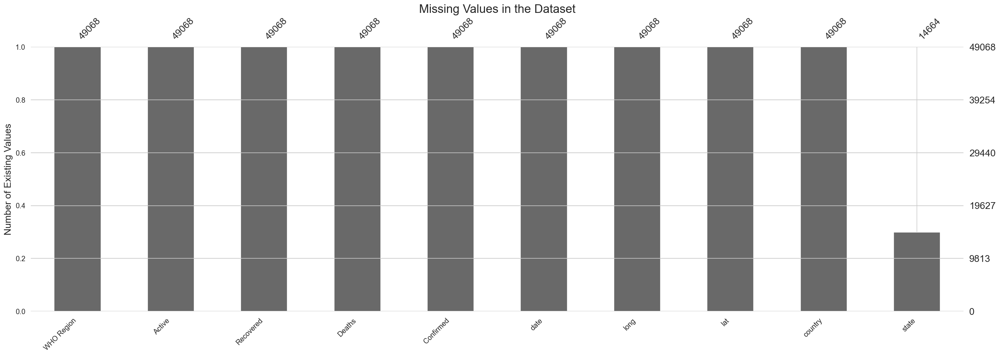

In [6]:
# Create a figure and axes object with your preferred size
fig, ax = plt.subplots(figsize=(28, 8))  # Adjust figsize to match your sns.set rc parameter

# Apply seaborn styles again if needed
sns.set_style("whitegrid")
sns.set_context("notebook")
sns.set_palette(sns.xkcd_palette(colors))

# Generate the missingno bar plot on the specified axes
msno.bar(cleaned_data, sort='descending', ax=ax)

# Add titles and labels using the axes object, respecting your font size preferences
ax.set_title('Missing Values in the Dataset', fontsize=20)
ax.set_ylabel('Number of Existing Values', fontsize=16)

# Here you can adjust any other aesthetic elements as per your global settings
ax.tick_params(axis='both', which='major', labelsize=12)  # Adjust tick parameters to match global settings

# Display the plot
plt.show()


Here we prepare the dataset for further analysis. Initially, we calculates active COVID-19 cases by subtracting deaths and recovered cases from confirmed cases, storing the result in a new `Active` column. The script then standardizes geographical names by replacing 'Mainland China' with 'China' in the country column. To ensure the dataset handles null values consistently, we fills missing entries in the `state` column with empty strings and assigns zero to null values in the case-related columns (`Confirmed`, `Deaths`, `Recovered`, `Active`). Additionally, we renames the 'Date' column to 'date' for naming consistency. After these transformations, the cleaned data is reassigned to a new variable, `df`, which is then used to print summary information about the dataset, including the earliest and latest dates and the total duration covered by the data.

In [7]:
# create a new column of active cases 
cases = ['Confirmed','Deaths','Recovered','Active']
cleaned_data['Active'] = cleaned_data['Confirmed'] - cleaned_data['Deaths'] - cleaned_data['Recovered']

# replace 'mainland china' with 'china'
cleaned_data['country'] = cleaned_data['country'].replace('Mainland China', 'China')

# fill blank in state column for null values
cleaned_data[['state']] = cleaned_data[['state']].fillna('')

# fill 0 in cases for null values
cleaned_data[cases] = cleaned_data[cases].fillna(0)

# rename Date to date
cleaned_data.rename(columns={'Date':'date'}, inplace=True)
df = cleaned_data


print("External Data")
print(f"Earliest Entry: {df['date'].min()}")
print(f"Last Entry:     {df['date'].max()}")
print(f"Total Days:     {df['date'].max() - df['date'].min()}")

# Confirmed Covid-19 cases spread around globe over time

In [9]:
formated_gdf = df.groupby(['date', 'country'])[['Confirmed', 'Deaths']].max()
formated_gdf = formated_gdf.reset_index()
formated_gdf['date'] = pd.to_datetime(formated_gdf['date'])
formated_gdf['date'] = formated_gdf['date'].dt.strftime('%m/%d/%Y')
formated_gdf['size'] = formated_gdf['Confirmed'].pow(0.3)

fig = px.scatter_geo(formated_gdf, locations="country", locationmode='country names', 
                     color="Confirmed Num", size='size', hover_name="country", 
                     range_color= [0, 1500], 
                     projection="natural earth", animation_frame="date", 
                     title='COVID-19: Confirmed Cases Spread Over Time', color_continuous_scale="portland")
fig.show()

# Top 10 Affected Countries (worldwide) 

The following code snippet generates 2 bar plots showing the top 10 countries with the highest number of confirmed COVID-19 cases and displaying the portion of (`Deaths`, `Recovered`, `Active`) cases in each country (Top 10). The plots provide a visual representation of the countries most affected by the pandemic and the distribution of cases within these countries.

In [10]:
plt.figure(figsize=(16,28))
summary = df.groupby("country")[["Confirmed","Deaths","Active","Recovered"]].sum().reset_index().sort_values(by="Confirmed",ascending=False).reset_index(drop=True)[:10][::-1]

fig = go.Figure()
fig.add_trace(go.Bar(name='Confirmed Cases', y=list(summary["country"]), x=list(summary["Confirmed"]),orientation='h'))
fig.update_layout(title="Top 10 Affected Countries")
fig.show()

fig = go.Figure()
fig.add_trace(go.Bar(name='Active Cases', y=list(summary["country"]), x=list(summary["Active"]),orientation='h')),
fig.add_trace(go.Bar(name='Recovered Cases', y=list(summary["country"]), x=list(summary["Recovered"]),orientation='h'))
fig.add_trace(go.Bar(name='Death Cases', y=list(summary["country"]), x=list(summary["Deaths"]),orientation='h')),
fig.update_layout(barmode='stack',title="Active, Recovered & Deaths in Top 10 Countries")
fig.show()

<Figure size 960x1680 with 0 Axes>

# Comparisons

This visualization provides a clear comparison of the COVID-19 situation in these countries, highlighting the differences in the number of different kind of cases and the proportion of recovered, active and death cases.

In [11]:
grouped = df.groupby('date')[['Recovered', 'Deaths', 'Active']].sum().reset_index()

temp = grouped.melt(id_vars="date", value_vars=['Recovered', 'Deaths', 'Active'],
                 var_name='case', value_name='count')
fig = px.area(temp, x="date", y="count", color='case',
             title='Cases - Total Cases: Area Plot', color_discrete_sequence = ['cyan', 'red', 'orange'], labels={'count':'Comparisons', 'date':''})
fig.show()

# Total Cases (worldwide)

"Total Cases" refers to the overall tally of cumulative cases (5,529,971), which encompasses deaths and cases where patients have recovered or been discharged. The next two charts display global COVID-19 case numbers using different scales for comparison: the first chart employs a linear scale, and the second chart utilizes a logarithmic scale to more effectively illustrate the case distribution.

In [12]:
grouped = df.groupby('date')['Confirmed'].sum().reset_index()

fig = px.line(grouped, x="date", y="Confirmed", 
              title="Worldwide Confirmed Cases Over Time", labels={'date':'', 'Confirmed':'Total Coronavirus Cases'})
fig.show()

fig = px.line(grouped, x="date", y="Confirmed", 
              title="Worldwide Confirmed Cases (Logarithmic Scale) Over Time", 
              log_y=True,labels={'date':'', 'Confirmed':'Total Coronavirus Cases'})
fig.show()

# Daily Cases WorldWide

The following code snippet generates a bar plot showing the daily number of confirmed COVID-19 cases worldwide. The plot provides a visual representation of the daily progression of the pandemic, highlighting the peaks and troughs in the number of new cases reported each day.

The increase noted on February 12 primarily stems from a revision in diagnostic classification, where 13,332 cases confirmed clinically (as opposed to through laboratory tests) were all recorded as new cases on that date, despite being identified in the days and weeks prior. These cases will be appropriately reallocated to their actual dates once the ongoing analysis by the WHO, in collaboration with China's NHC, is finalized.

In [13]:
grouped = df.groupby(["date"])["Confirmed"].sum().reset_index()
grouped['daily_cases'] = grouped['Confirmed'].shift(-1) - grouped['Confirmed']
grouped['daily_cases'].fillna(0)
fig = px.bar(grouped, x='date',y='daily_cases', labels={'date':'', 'daily_cases':'Novel Coronavirus Daily Cases'},title='Daily New Cases')
fig.show()

# Growth Factor of Daily New Cases

The growth factor is a measure that indicates how much a quantity, such as daily new cases of a disease, multiplies over time. It is calculated by dividing the number of new cases on a given day by the number of new cases from the previous day. For instance, if there is a 7% increase in cases each day, the growth factor would be 1.07.

A growth factor greater than 1 suggests that the quantity is increasing, while a growth factor between 0 and 1 indicates a decrease, with the potential for the quantity to eventually reach zero. If the growth factor remains consistently above 1, it may indicate exponential growth. And the following code snippet calculates the growth factor for daily new cases of COVID-19 worldwide and generates a line plot to visualize the trend.

In [14]:
grouped["growth_factor"] = grouped["daily_cases"].shift(-1) / grouped["daily_cases"]
grouped["growth_factor"]=grouped["growth_factor"].fillna(0)
fig = go.Figure()
fig.add_trace(go.Scatter(x=grouped['date'], y=grouped["growth_factor"],
                    mode='lines+markers',
                    name='lines+markers'))
fig.update_layout(
    title={
        'text': "Growth Factor",
})
fig.show()

# Total Cases excluding mailand China

In [15]:
grouped = df[df["country"]!="China"].groupby('date')['Confirmed'].sum().reset_index()

fig = px.line(grouped, x="date", y="Confirmed", 
              title="Total Cases outside of China (Linear Scale)", labels={'date':'', 'Confirmed':'Total Coronavirus Cases'})
fig.show()

fig = px.line(grouped, x="date", y="Confirmed", 
              title="Total Cases outside of China (Logarithmic Scale)", 
              log_y=True, labels={'date':'', 'Confirmed':'Total Coronavirus Cases'})
fig.show()

# Daily Cured Cases Excluding Mainland China
The following code snippet generates a bar plot showing the daily number of cured COVID-19 cases worldwide, excluding cases from mainland China. The plot provides a visual representation of the daily progression of recoveries from the pandemic, highlighting the peaks and troughs in the number of new cases reported each day.

In [16]:
grouped = df[df["country"]!="China"].groupby(["date"])["Confirmed"].sum().reset_index()
grouped['daily_cases'] = grouped['Confirmed'].shift(-1) - grouped['Confirmed']
grouped['daily_cases'].fillna(0)
fig = px.bar(grouped, x='date',y='daily_cases', labels={'date':'', 'daily_cases':'Novel Coronavirus Daily Cured'},title='Daily Cured')
fig.show()

# Growth Factor Excluding Mailand China

The following again calculates the growth factor for daily new cases of COVID-19 worldwide, excluding cases from mainland China, and generates a line plot to visualize the trend. This analysis provides insights into the global spread of the virus and the effectiveness of containment measures in different regions.

In [17]:
grouped["growth_factor"] = grouped["daily_cases"].shift(-1) / grouped["daily_cases"]
grouped["growth_factor"]=grouped["growth_factor"].fillna(0)
fig = go.Figure()
fig.add_trace(go.Scatter(x=grouped['date'], y=grouped["growth_factor"],
                    mode='lines+markers',
                    name='lines+markers'))
fig.update_layout(
    title={
        'text': "Growth Factor",
})
fig.show()

# Cases

A visualisation of the number of confirmed cases worldwide, is displayed in the following code snippet. The plot provides a clear comparison of the distribution of cases across 2 different regions( China and other countries), highlighting the impact of the pandemic on a global scale.

In [18]:
plt.figure(figsize=(8,8))
grouped = df.groupby("country")["Confirmed"].sum().reset_index()

temp = pd.DataFrame()
temp["China"] = grouped[grouped["country"]=="China"]["Confirmed"]
temp["Others"] = grouped[grouped["country"]!="China"]["Confirmed"].sum()
temp = temp.melt()

fig = px.pie(temp, values='value', names='variable', title='Distribution of Cases WorldWide',color='variable', color_discrete_map={'Others':'lightcyan',
                                 'China':'royalblue'}, hover_data=['value'], labels={'value':'Total Affected','variable':'Country'})
fig.update_traces(textposition='inside', textinfo='percent+label')
fig.show()

<Figure size 480x480 with 0 Axes>

# Active Cases

Subtracting the number of deaths and recoveries from the total cases gives us the "currently infected cases" or "active cases," which represent the cases that are still pending an outcome. The following plot visualising the active cases worldwide, provides insights into the current status of the pandemic and the regions most affected by the virus. Then the line plot shows the number of active cases worldwide over time, highlighting the fluctuations in the number of ongoing cases.

In [19]:
formated_gdf = df.groupby(['date', 'country'])[['Confirmed', 'Deaths', 'Active', 'Recovered']].max()
formated_gdf = formated_gdf.reset_index()
formated_gdf['date'] = pd.to_datetime(formated_gdf['date'])
formated_gdf['date'] = formated_gdf['date'].dt.strftime('%m/%d/%Y')
formated_gdf['size'] = formated_gdf['Active'].pow(0.3)
formated_gdf['size'].fillna(formated_gdf['size'].mean(),inplace=True)

fig = px.scatter_geo(formated_gdf, locations="country", locationmode='country names', 
                     color="Active", size='size', hover_name="country", 
                     range_color= [0, 1000], 
                     projection="natural earth", animation_frame="date", 
                     title='COVID-19: Active Cases Over Time', color_continuous_scale="portland")
fig.update(layout_coloraxis_showscale=False)
fig.show()

In [20]:
grouped_df = df.groupby('date')['Active'].sum().reset_index()
fig = go.Figure()
fig.add_trace(go.Scatter(x=grouped_df['date'], y=grouped_df['Active'],
                    mode='lines+markers',
                    name='Active Cases'))
fig.update_layout(
    title={
        'text': "Active Cases",
})

# Recovered and Discharged

Then we plot the total recovers cases over time and the daily recovered cases worldwide. The plots provide insights into the recovery rate and the effectiveness of treatment and containment measures in different regions.

In [21]:
grouped_df = df.groupby('date')['Recovered'].sum().reset_index()
fig = go.Figure()
fig.add_trace(go.Scatter(x=grouped_df['date'], y=grouped_df['Recovered'],
                    mode='lines+markers',
                    name='Recovered Cases'))
fig.update_layout(
    title={
        'text': "Total Recovered Cases",
})

In [22]:
grouped = df.groupby(["date"])["Recovered"].sum().reset_index()
grouped['daily_cases'] = grouped['Recovered'].shift(-1) - grouped['Recovered']
grouped['daily_cases'].fillna(0)
fig = px.bar(grouped, x='date',y='daily_cases',labels={'date':'', 'daily_cases':'Novel Coronavirus Daily Cured'},title='Daily Cured')

fig.show()

## Outcome of Cases (Recovery or Death)

The following code snippet generates a line plot showing the distribution of outcomes (recovery or death) for COVID-19 cases worldwide. The plot provides a visual representation of the proportion of cases that have resulted in recovery or death, highlighting the impact of the pandemic on global health outcomes. Then we plot the daily outcome of cases worldwide, providing insights into the progression of the pandemic and the distribution of outcomes over time.

In [23]:
grouped_df = df.groupby('date')[['Recovered','Deaths']].sum().reset_index()
fig = go.Figure()
fig.add_trace(go.Scatter(x=grouped_df['date'], y=grouped_df['Recovered'],
                    mode='lines+markers',
                    name='Recovered Cases'))
fig.add_trace(go.Scatter(x=grouped_df['date'], y=grouped_df['Deaths'],
                    mode='lines+markers',
                    name='Death Cases'))

fig.update_layout(
    title={
        'text': "Outcome of Cases (Recovery or Death)",
})

In [24]:
grouped = df.groupby(["date"])[["Recovered","Deaths"]].sum().reset_index()
grouped['daily_cases_rec'] = grouped['Recovered'].shift(-1) - grouped['Recovered']
grouped['daily_cases_death'] = grouped['Deaths'].shift(-1) - grouped['Deaths']

fig = go.Figure()
fig.add_trace(go.Scatter(x=grouped['date'], y=grouped['daily_cases_rec'],
                    mode='lines+markers',
                    name='Recovered Cases'))
fig.add_trace(go.Scatter(x=grouped['date'], y=grouped['daily_cases_death'],
                    mode='lines+markers',
                    name='Death Cases'))

fig.update_layout(
    title={
        'text': "Outcome of Cases everyday (Recovery or Death)",
})
fig.show()

# Deaths over time

Here is a visualisation of the total deaths over time and region, which can provide insights into the impact of the pandemic on global health outcomes,highlighting the progression of the pandemic and the regions most affected by the virus.

In [25]:
formated_gdf = df.groupby(['date', 'country'])[['Confirmed', 'Deaths']].max()
formated_gdf = formated_gdf.reset_index()
formated_gdf['date'] = pd.to_datetime(formated_gdf['date'])
formated_gdf['date'] = formated_gdf['date'].dt.strftime('%m/%d/%Y')
formated_gdf['size'] = formated_gdf['Deaths'].pow(0.3)

fig = px.scatter_geo(formated_gdf, locations="country", locationmode='country names', 
                     color="Deaths", size='size', hover_name="country", 
                     range_color= [0, 100], 
                     projection="natural earth", animation_frame="date", 
                     title='COVID-19: Deaths Over Time', color_continuous_scale="peach")
# fig.update(layout_coloraxis_showscale=False)
fig.show()